In [1]:
from google.colab import drive
drive.mount('/content/drive')

!unzip -q -o /content/drive/MyDrive/dataset_v4.zip -d /content/data_v4
!ls /content/data_v4

Mounted at /content/drive
dataset


In [2]:
import os, numpy as np, pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from sklearn.metrics import confusion_matrix, classification_report
import cv2, matplotlib.pyplot as plt
import matplotlib.cm as cm

DATA  = '/content/data_v4/dataset'
RAW   = os.path.join(DATA, 'raw')
IMG   = 224
CLASSES     = ['clean', 'slightly_dirty', 'dirty']
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASSES)}

Sample: /content/data_v4/dataset/raw/lumina_D/clean/clean_20260531T104856_271148Z.jpg


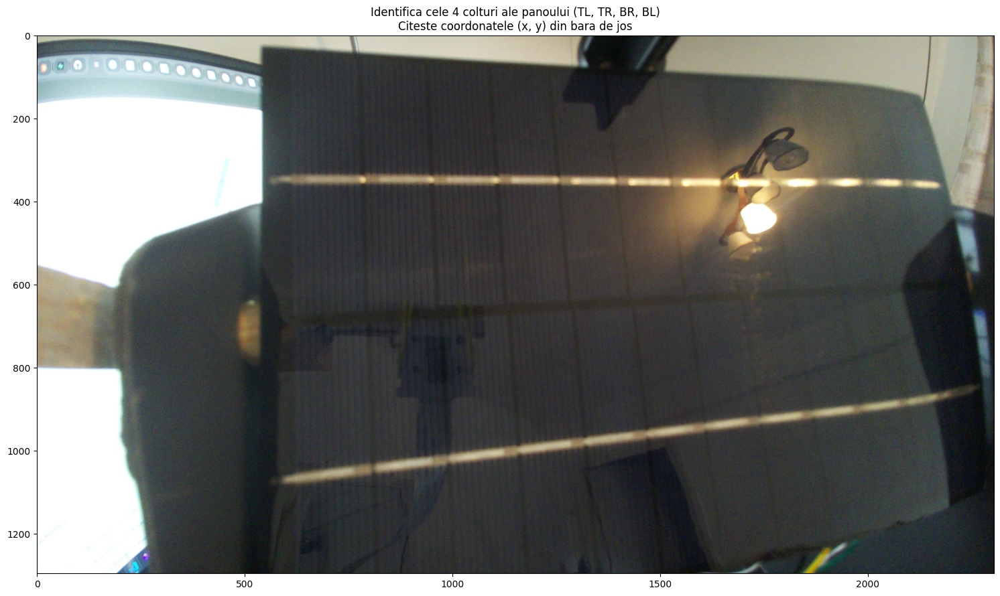

Dimensiuni imagine: 2304x1296 px


In [3]:
# Ruleaza asta inainte sa setezi PANEL_PTS
# Treci cu mouse-ul peste colturi si citeste coordonatele din bara de jos a graficului

sample_path = next(
    os.path.join(root, f)
    for root, _, files in os.walk(RAW)
    for f in files
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
)
print("Sample:", sample_path)

raw_img = cv2.cvtColor(cv2.imread(sample_path), cv2.COLOR_BGR2RGB)
fig, ax = plt.subplots(figsize=(16, 9))
ax.imshow(raw_img)
ax.set_title("Identifica cele 4 colturi ale panoului (TL, TR, BR, BL)\nCiteste coordonatele (x, y) din bara de jos")
plt.tight_layout()
plt.show()
print(f"Dimensiuni imagine: {raw_img.shape[1]}x{raw_img.shape[0]} px")

In [4]:
# Colturi ale panoului in imaginea originala: TL, TR, BR, BL (pixeli)
# MODIFICA aceste valori dupa ce rulezi celula de preview de mai jos
PANEL_PTS = np.float32([
    [390,   55],   # TL
    [1390, 185],   # TR
    [1390, 870],   # BR
    [340,  1270],  # BL - la marginea inferioara a imaginii
])

WARP_W, WARP_H = 600, 400   # dimensiuni output dupa warp

DST_PTS = np.float32([
    [0,      0],
    [WARP_W, 0],
    [WARP_W, WARP_H],
    [0,      WARP_H],
])

M = cv2.getPerspectiveTransform(PANEL_PTS, DST_PTS)
print("Matrice warp calculata.")

Matrice warp calculata.


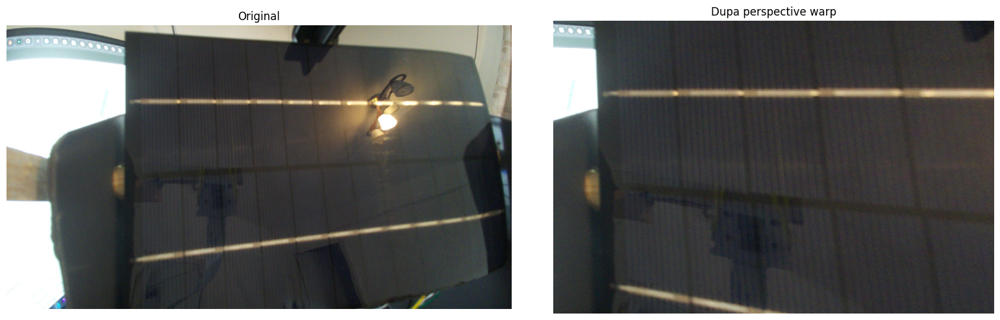

In [5]:
# Ruleaza dupa ce ai setat PANEL_PTS corect in Celula 3

warped_preview = cv2.warpPerspective(raw_img, M, (WARP_W, WARP_H))

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
axes[0].imshow(raw_img);        axes[0].set_title("Original");                axes[0].axis('off')
axes[1].imshow(warped_preview); axes[1].set_title("Dupa perspective warp");   axes[1].axis('off')
plt.tight_layout()
plt.show()

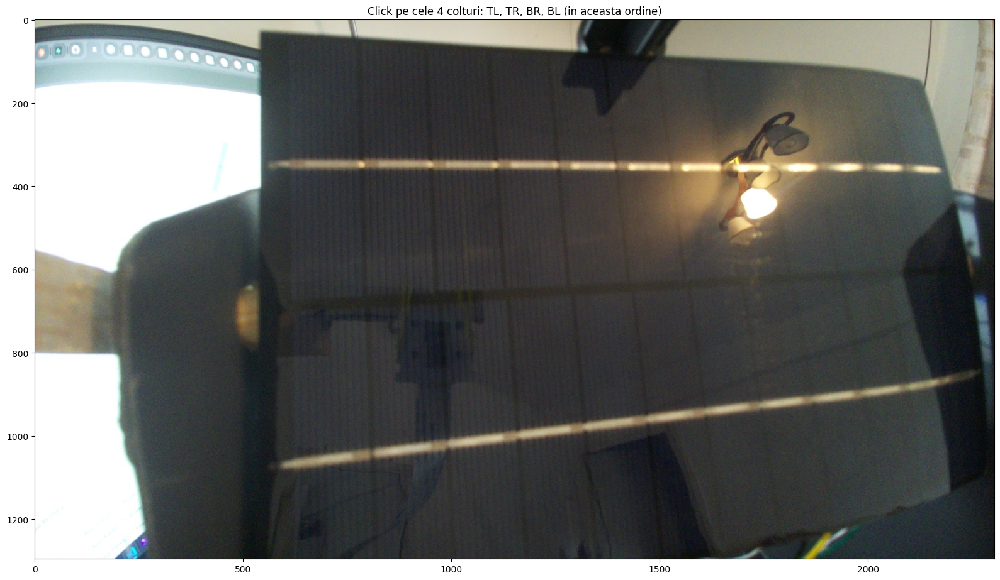

In [6]:
from google.colab import output
import matplotlib.pyplot as plt
import cv2

sample_path = next(
    os.path.join(root, f)
    for root, _, files in os.walk(RAW)
    for f in files
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
)

raw_img = cv2.cvtColor(cv2.imread(sample_path), cv2.COLOR_BGR2RGB)
clicked = []

fig, ax = plt.subplots(figsize=(16, 10))
ax.imshow(raw_img)
ax.set_title("Click pe cele 4 colturi: TL, TR, BR, BL (in aceasta ordine)")

def on_click(event):
    if event.xdata and event.ydata:
        x, y = int(event.xdata), int(event.ydata)
        clicked.append([x, y])
        ax.plot(x, y, 'r+', markersize=15, markeredgewidth=2)
        ax.annotate(f"{'TL TR BR BL'.split()[len(clicked)-1]} ({x},{y})",
                    (x, y), color='red', fontsize=10)
        fig.canvas.draw()
        print(f"Click {len(clicked)}: ({x}, {y})")
        if len(clicked) == 4:
            print("\nCopie asta in Celula 3:")
            print(f"PANEL_PTS = np.float32({clicked})")

fig.canvas.mpl_connect('button_press_event', on_click)
plt.tight_layout()
plt.show()

In [7]:
import cv2, matplotlib.pyplot as plt
import matplotlib.ticker as ticker

raw_img = cv2.cvtColor(cv2.imread(sample_path), cv2.COLOR_BGR2RGB)
h, w = raw_img.shape[:2]

fig, ax = plt.subplots(figsize=(18, 12))
ax.imshow(raw_img)

# Grid la fiecare 100px
ax.xaxis.set_major_locator(ticker.MultipleLocator(100))
ax.yaxis.set_major_locator(ticker.MultipleLocator(100))
ax.grid(True, color='red', alpha=0.4, linewidth=0.8)
ax.set_title(f"Imagine {w}x{h}px - citeste coordonatele din grid")
plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [8]:
# Colturi ale panoului in imaginea originala: TL, TR, BR, BL (pixeli)
# MODIFICA aceste valori dupa ce rulezi celula de preview de mai jos
PANEL_PTS = np.float32([
    [400,    60],   # TL
    [1350,   60],   # TR
    [1400,  950],   # BR
    [370,  1296],   # BL - la marginea inferioara
])

WARP_W, WARP_H = 600, 400   # dimensiuni output dupa warp

DST_PTS = np.float32([
    [0,      0],
    [WARP_W, 0],
    [WARP_W, WARP_H],
    [0,      WARP_H],
])

M = cv2.getPerspectiveTransform(PANEL_PTS, DST_PTS)
print("Matrice warp calculata.")

Matrice warp calculata.


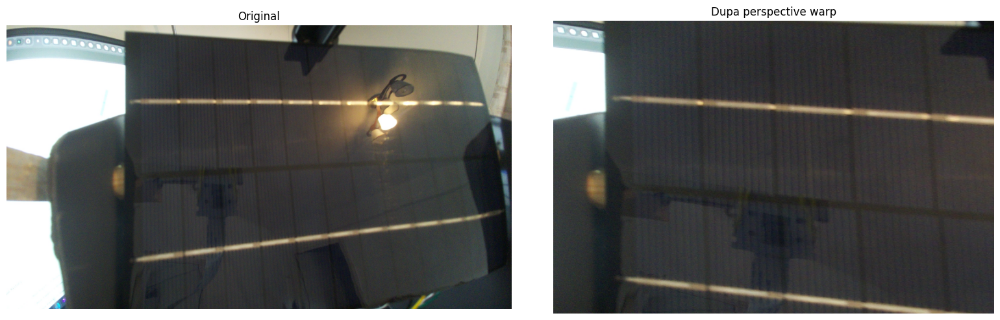

In [9]:
warped_preview = cv2.warpPerspective(raw_img, M, (WARP_W, WARP_H))

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
axes[0].imshow(raw_img);        axes[0].set_title("Original");                axes[0].axis('off')
axes[1].imshow(warped_preview); axes[1].set_title("Dupa perspective warp");   axes[1].axis('off')
plt.tight_layout()
plt.show()

In [10]:
PANEL_PTS = np.float32([
    [500,    60],   # TL - mutat spre dreapta (era 400)
    [1350,   60],   # TR
    [1400,  950],   # BR
    [480,  1296],   # BL - mutat spre dreapta (era 370)
])

WARP_W, WARP_H = 600, 400   # dimensiuni output dupa warp

DST_PTS = np.float32([
    [0,      0],
    [WARP_W, 0],
    [WARP_W, WARP_H],
    [0,      WARP_H],
])

M = cv2.getPerspectiveTransform(PANEL_PTS, DST_PTS)
print("Matrice warp calculata.")

Matrice warp calculata.


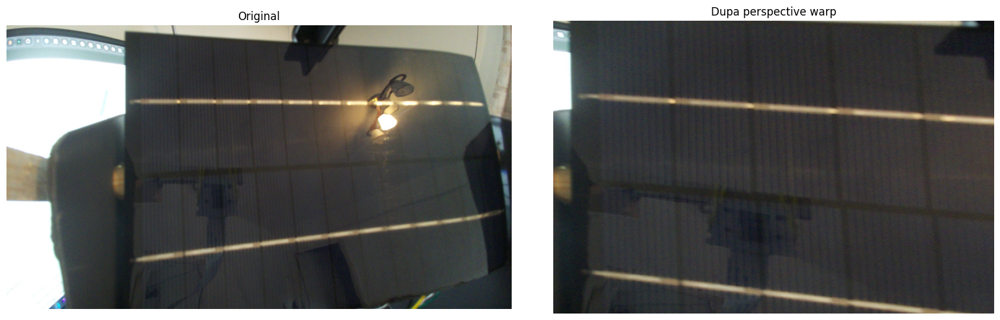

In [11]:
warped_preview = cv2.warpPerspective(raw_img, M, (WARP_W, WARP_H))

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
axes[0].imshow(raw_img);        axes[0].set_title("Original");                axes[0].axis('off')
axes[1].imshow(warped_preview); axes[1].set_title("Dupa perspective warp");   axes[1].axis('off')
plt.tight_layout()
plt.show()

In [12]:
PANEL_PTS = np.float32([
    [490,    70],   # TL - coltul de sus stanga al panoului
    [1530,  130],   # TR - coltul de sus dreapta (mai jos, panoul e inclinat)
    [1560, 1050],   # BR - jos dreapta
    [450,  1180],   # BL - jos stanga (aproape de marginea de jos)
])
WARP_W, WARP_H = 600, 400   # dimensiuni output dupa warp

DST_PTS = np.float32([
    [0,      0],
    [WARP_W, 0],
    [WARP_W, WARP_H],
    [0,      WARP_H],
])

M = cv2.getPerspectiveTransform(PANEL_PTS, DST_PTS)
print("Matrice warp calculata.")

Matrice warp calculata.


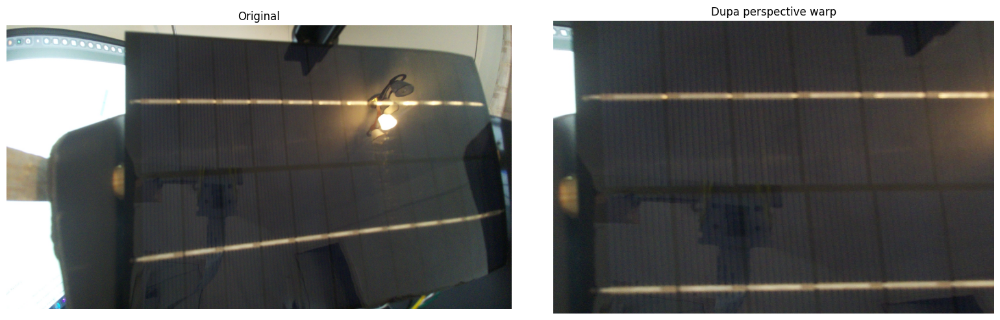

In [13]:
warped_preview = cv2.warpPerspective(raw_img, M, (WARP_W, WARP_H))

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
axes[0].imshow(raw_img);        axes[0].set_title("Original");                axes[0].axis('off')
axes[1].imshow(warped_preview); axes[1].set_title("Dupa perspective warp");   axes[1].axis('off')
plt.tight_layout()
plt.show()

In [14]:
PANEL_PTS = np.float32([
    [550,    70],   # TL - coltul de sus stanga al panoului
    [1530,  130],   # TR - coltul de sus dreapta (mai jos, panoul e inclinat)
    [1560, 1050],   # BR - jos dreapta
    [450,  1180],   # BL - jos stanga (aproape de marginea de jos)
])
WARP_W, WARP_H = 600, 400   # dimensiuni output dupa warp

DST_PTS = np.float32([
    [0,      0],
    [WARP_W, 0],
    [WARP_W, WARP_H],
    [0,      WARP_H],
])

M = cv2.getPerspectiveTransform(PANEL_PTS, DST_PTS)
print("Matrice warp calculata.")

Matrice warp calculata.


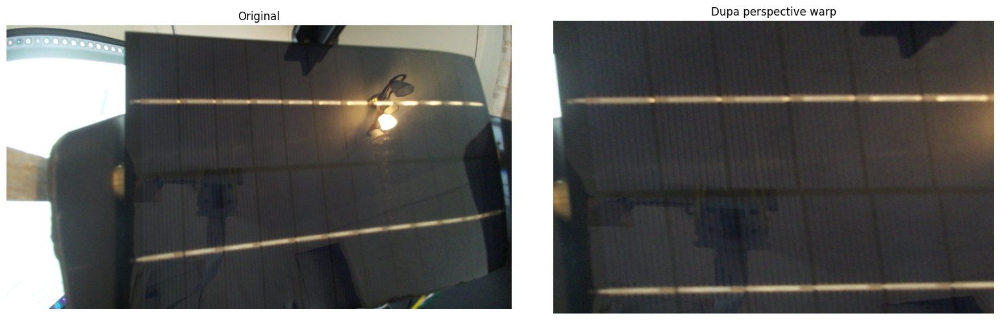

In [15]:
warped_preview = cv2.warpPerspective(raw_img, M, (WARP_W, WARP_H))

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
axes[0].imshow(raw_img);        axes[0].set_title("Original");                axes[0].axis('off')
axes[1].imshow(warped_preview); axes[1].set_title("Dupa perspective warp");   axes[1].axis('off')
plt.tight_layout()
plt.show()

In [16]:
import ipywidgets as widgets
from IPython.display import display
import cv2, numpy as np, matplotlib.pyplot as plt

h, w = raw_img.shape[:2]
WARP_W, WARP_H = 600, 400
DST_PTS = np.float32([[0,0],[WARP_W,0],[WARP_W,WARP_H],[0,WARP_H]])

def make_slider(label, val, maxv):
    return widgets.IntSlider(value=val, min=0, max=maxv, step=5,
                             description=label, continuous_update=False,
                             layout=widgets.Layout(width='400px'))

tl_x = make_slider('TL x', 490, w); tl_y = make_slider('TL y', 70, h)
tr_x = make_slider('TR x', 1530, w); tr_y = make_slider('TR y', 130, h)
br_x = make_slider('BR x', 1560, w); br_y = make_slider('BR y', 1050, h)
bl_x = make_slider('BL x', 450, w); bl_y = make_slider('BL y', 1180, h)

def update(tlx,tly,trx,try_,brx,bry,blx,bly):
    pts = np.float32([[tlx,tly],[trx,try_],[brx,bry],[blx,bly]])
    Mlive = cv2.getPerspectiveTransform(pts, DST_PTS)
    warped = cv2.warpPerspective(raw_img, Mlive, (WARP_W, WARP_H))

    overlay = raw_img.copy()
    cv2.polylines(overlay, [pts.astype(int)], True, (255,0,0), 6)

    fig, ax = plt.subplots(1, 2, figsize=(16,5))
    ax[0].imshow(overlay); ax[0].set_title("Colturi selectate"); ax[0].axis('off')
    ax[1].imshow(warped); ax[1].set_title("Warp rezultat"); ax[1].axis('off')
    plt.tight_layout(); plt.show()

    print(f"PANEL_PTS = np.float32([[{tlx},{tly}],[{trx},{try_}],[{brx},{bry}],[{blx},{bly}]])")

out = widgets.interactive_output(update, {
    'tlx':tl_x,'tly':tl_y,'trx':tr_x,'try_':tr_y,
    'brx':br_x,'bry':br_y,'blx':bl_x,'bly':bl_y})

display(widgets.HBox([
    widgets.VBox([tl_x,tl_y,tr_x,tr_y]),
    widgets.VBox([br_x,br_y,bl_x,bl_y])
]), out)

Output()

In [17]:
import os, numpy as np, pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from sklearn.metrics import confusion_matrix, classification_report
import cv2, matplotlib.pyplot as plt
import matplotlib.cm as cm

DATA  = '/content/data_v4/dataset'
RAW   = os.path.join(DATA, 'raw')
IMG   = 224
CLASSES      = ['clean', 'slightly_dirty', 'dirty']
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASSES)}

In [18]:
PANEL_PTS = np.float32([
    [550,    35],   # TL
    [2140,  140],   # TR
    [2300, 1115],   # BR
    [535,  1290],   # BL
])

WARP_W, WARP_H = 600, 400

DST_PTS = np.float32([
    [0,      0],
    [WARP_W, 0],
    [WARP_W, WARP_H],
    [0,      WARP_H],
])

M = cv2.getPerspectiveTransform(PANEL_PTS, DST_PTS)
print("Matrice warp calculata.")

Matrice warp calculata.


In [19]:
# CLAHE pe canalul L (luminanta) din LAB:
# egalizeaza lumina inegala (bec, umbre) si pastreaza culoarea + textura.
_clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

def preprocess(img_rgb: np.ndarray) -> np.ndarray:
    """Warp perspectiva + CLAHE. Input/output: RGB uint8."""
    img = cv2.warpPerspective(img_rgb, M, (WARP_W, WARP_H))
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    l = _clahe.apply(l)
    return cv2.cvtColor(cv2.merge([l, a, b]), cv2.COLOR_LAB2RGB)

def load_img(path: str) -> np.ndarray:
    img = cv2.imread(path)
    if img is None:
        raise FileNotFoundError(f"Nu s-a putut citi: {path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = preprocess(img)
    img = cv2.resize(img, (IMG, IMG))
    return img.astype(np.float32) / 255.0

Sample: /content/data_v4/dataset/raw/lumina_D/clean/clean_20260531T104856_271148Z.jpg


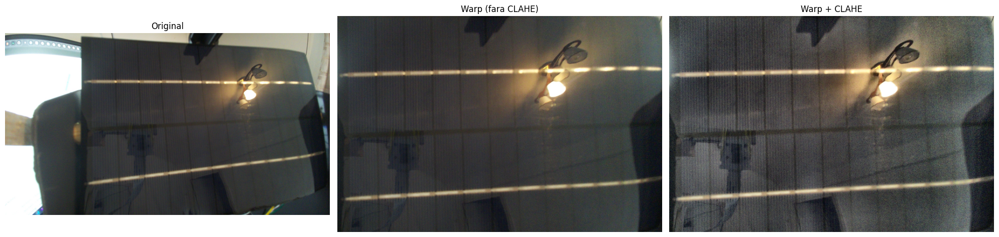

In [20]:
sample_path = next(
    os.path.join(root, f)
    for root, _, files in os.walk(RAW)
    for f in files
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
)
print("Sample:", sample_path)

raw_img    = cv2.cvtColor(cv2.imread(sample_path), cv2.COLOR_BGR2RGB)
warped     = cv2.warpPerspective(raw_img, M, (WARP_W, WARP_H))
warped_cla = preprocess(raw_img)

fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(raw_img);    axes[0].set_title("Original");          axes[0].axis('off')
axes[1].imshow(warped);     axes[1].set_title("Warp (fara CLAHE)"); axes[1].axis('off')
axes[2].imshow(warped_cla); axes[2].set_title("Warp + CLAHE");      axes[2].axis('off')
plt.tight_layout()
plt.show()

In [21]:
import random

sessions_all = sorted(df['session_id'].unique())
fig, axes = plt.subplots(len(sessions_all), 2, figsize=(12, 4*len(sessions_all)))
if len(sessions_all) == 1:
    axes = axes.reshape(1, -1)

for i, sess in enumerate(sessions_all):
    p = df[df['session_id'] == sess]['path'].iloc[0]
    raw = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
    warped = preprocess(raw)
    axes[i][0].imshow(raw);    axes[i][0].set_title(f"{sess} - original");  axes[i][0].axis('off')
    axes[i][1].imshow(warped); axes[i][1].set_title(f"{sess} - warp+CLAHE"); axes[i][1].axis('off')

plt.tight_layout()
plt.show()

NameError: name 'df' is not defined

In [22]:
df = pd.read_csv(os.path.join(DATA, 'manifest.csv'))
df['path'] = df.apply(
    lambda r: os.path.join(RAW, r['session_id'], r['class'], r['filename']), axis=1
)
df = df[df['path'].apply(os.path.exists)].reset_index(drop=True)
df = df[df['class'].isin(CLASSES)].reset_index(drop=True)

print("Total imagini:", len(df))
print(df['class'].value_counts())
print("Sesiuni:", sorted(df['session_id'].unique()))

Total imagini: 615
class
dirty             226
clean             200
slightly_dirty    189
Name: count, dtype: int64
Sesiuni: ['lumina_A', 'lumina_B', 'lumina_C', 'lumina_D', 'lumina_E', 'lumina_F', 'lumina_G', 'lumina_H', 'lumina_aux_A']


In [23]:
import random

sessions_all = sorted(df['session_id'].unique())
fig, axes = plt.subplots(len(sessions_all), 2, figsize=(12, 4*len(sessions_all)))
if len(sessions_all) == 1:
    axes = axes.reshape(1, -1)

for i, sess in enumerate(sessions_all):
    p = df[df['session_id'] == sess]['path'].iloc[0]
    raw = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
    warped = preprocess(raw)
    axes[i][0].imshow(raw);    axes[i][0].set_title(f"{sess} - original");  axes[i][0].axis('off')
    axes[i][1].imshow(warped); axes[i][1].set_title(f"{sess} - warp+CLAHE"); axes[i][1].axis('off')

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [24]:
df = pd.read_csv(os.path.join(DATA, 'manifest.csv'))
df['path'] = df.apply(lambda r: os.path.join(RAW, r['session_id'], r['class'], r['filename']), axis=1)
df = df[df['path'].apply(os.path.exists)].reset_index(drop=True)
df = df[df['class'].isin(CLASSES)].reset_index(drop=True)

# EXCLUDE sesiunile aux
df = df[~df['session_id'].str.contains('aux', case=False)].reset_index(drop=True)

print("total (fara aux):", len(df))
print(df['class'].value_counts())
print("sesiuni:", sorted(df['session_id'].unique()))

total (fara aux): 517
class
dirty             186
clean             172
slightly_dirty    159
Name: count, dtype: int64
sesiuni: ['lumina_A', 'lumina_B', 'lumina_C', 'lumina_D', 'lumina_E', 'lumina_F', 'lumina_G', 'lumina_H']


In [25]:
sessions = sorted(df['session_id'].unique())
print("Sesiuni disponibile:", sessions)

# Pune sesiunea de zi (lumina naturala) in test ca sa masori generalizarea
TEST_SESSION   = sessions[-1]   # <-- modifica daca stii exact care e sesiunea de zi
val_sessions   = [sessions[-2]] if len(sessions) >= 2 else [sessions[-1]]
train_sessions = [s for s in sessions if s not in [TEST_SESSION] + val_sessions]

print("TRAIN:", train_sessions)
print("VAL:  ", val_sessions)
print("TEST: ", [TEST_SESSION])

df_tr  = df[df['session_id'].isin(train_sessions)]
df_val = df[df['session_id'].isin(val_sessions)]
df_te  = df[df['session_id'] == TEST_SESSION]

for name, d in [("train", df_tr), ("val", df_val), ("test", df_te)]:
    print(name, len(d), dict(d['class'].value_counts()))

Sesiuni disponibile: ['lumina_A', 'lumina_B', 'lumina_C', 'lumina_D', 'lumina_E', 'lumina_F', 'lumina_G', 'lumina_H']
TRAIN: ['lumina_A', 'lumina_B', 'lumina_C', 'lumina_D', 'lumina_E', 'lumina_F']
VAL:   ['lumina_G']
TEST:  ['lumina_H']
train 392 {'dirty': np.int64(135), 'clean': np.int64(134), 'slightly_dirty': np.int64(123)}
val 62 {'dirty': np.int64(27), 'slightly_dirty': np.int64(19), 'clean': np.int64(16)}
test 63 {'dirty': np.int64(24), 'clean': np.int64(22), 'slightly_dirty': np.int64(17)}


In [26]:
def load_set(d: pd.DataFrame):
    X = np.stack([load_img(p) for p in d['path']])
    y = d['class'].map(CLASS_TO_IDX).values
    return X, y

X_tr,  y_tr  = load_set(df_tr)
X_val, y_val = load_set(df_val)
X_te,  y_te  = load_set(df_te)

print("Train:", X_tr.shape,  "| Val:", X_val.shape, "| Test:", X_te.shape)
print("y_tr:",  np.unique(y_tr,  return_counts=True))
print("y_val:", np.unique(y_val, return_counts=True))
print("y_te:",  np.unique(y_te,  return_counts=True))

Train: (392, 224, 224, 3) | Val: (62, 224, 224, 3) | Test: (63, 224, 224, 3)
y_tr: (array([0, 1, 2]), array([134, 123, 135]))
y_val: (array([0, 1, 2]), array([16, 19, 27]))
y_te: (array([0, 1, 2]), array([22, 17, 24]))


In [27]:
aug = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.06),
    layers.RandomBrightness(0.15),
    layers.RandomContrast(0.15),
])

base = MobileNetV2(input_shape=(IMG, IMG, 3), include_top=False, weights='imagenet')
base.trainable = False

model = models.Sequential([
    layers.Input((IMG, IMG, 3)),
    aug,
    base,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(len(CLASSES), activation='softmax'),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)
model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,339 (9.24 MB)

 Trainable params: 164,355 (642.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [28]:
es = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=6, restore_best_weights=True
)

h1 = model.fit(
    X_tr, y_tr,
    validation_data=(X_val, y_val),
    epochs=40,
    batch_size=16,
    callbacks=[es],
)

Epoch 1/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.3469 - loss: 1.3584 - val_accuracy: 0.4355 - val_loss: 1.7199
Epoch 2/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.4311 - loss: 1.1958 - val_accuracy: 0.4677 - val_loss: 0.8944
Epoch 3/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 909ms/step - accuracy: 0.4260 - loss: 1.0353 - val_accuracy: 0.6129 - val_loss: 0.8338
Epoch 4/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.5281 - loss: 0.9253 - val_accuracy: 0.5484 - val_loss: 0.7262
Epoch 5/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 913ms/step - accuracy: 0.4974 - loss: 0.9202 - val_accuracy: 0.6935 - val_loss: 0.5937
Epoch 6/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 40s 877ms/step - accuracy: 0.5510 - loss: 0.8883 - val_accuracy: 0.9032 - val_loss: 0.4256
Epoch 7/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 42s 937ms/step - accuracy: 0.4643 - loss: 0.9339 - val_accuracy: 0.8548 - val_loss: 0.4007
Epoch 8/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.4617 - loss: 0.8862 - val_accuracy: 0.8871

In [29]:
es = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=6, restore_best_weights=True
)

h1 = model.fit(
    X_tr, y_tr,
    validation_data=(X_val, y_val),
    epochs=40,
    batch_size=16,
    callbacks=[es],
)

Epoch 1/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 22s 873ms/step - accuracy: 0.4847 - loss: 0.8949 - val_accuracy: 0.7581 - val_loss: 0.5412
Epoch 2/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 41s 871ms/step - accuracy: 0.5281 - loss: 0.8364 - val_accuracy: 0.8710 - val_loss: 0.4306
Epoch 3/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 22s 895ms/step - accuracy: 0.4949 - loss: 0.9058 - val_accuracy: 0.9516 - val_loss: 0.4243
Epoch 4/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 41s 889ms/step - accuracy: 0.5510 - loss: 0.8244 - val_accuracy: 0.6774 - val_loss: 0.7500
Epoch 5/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 24s 939ms/step - accuracy: 0.5153 - loss: 0.8551 - val_accuracy: 0.8710 - val_loss: 0.3496
Epoch 6/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 22s 878ms/step - accuracy: 0.5357 - loss: 0.8392 - val_accuracy: 0.7742 - val_loss: 0.4546
Epoch 7/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.5179 - loss: 0.8570 - val_accuracy: 0.8548 - val_loss: 0.3665
Epoch 8/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - accuracy: 0.5357 - loss: 0.8406 - val_accuracy: 

In [30]:
base.trainable = True
for layer in base.layers[:-20]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

h2 = model.fit(
    X_tr, y_tr,
    validation_data=(X_val, y_val),
    epochs=15,
    batch_size=16,
    callbacks=[es],
)

Epoch 1/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - accuracy: 0.4490 - loss: 1.0745 - val_accuracy: 0.8871 - val_loss: 0.3493
Epoch 2/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.4923 - loss: 0.9758 - val_accuracy: 0.9355 - val_loss: 0.3381
Epoch 3/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5510 - loss: 0.9005 - val_accuracy: 0.9355 - val_loss: 0.3304
Epoch 4/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.4974 - loss: 0.9181 - val_accuracy: 0.9194 - val_loss: 0.3308
Epoch 5/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.5051 - loss: 0.9109 - val_accuracy: 0.9194 - val_loss: 0.3279
Epoch 6/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.4821 - loss: 0.8904 - val_accuracy: 0.9194 - val_loss: 0.3215
Epoch 7/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.5306 - loss: 0.8936 - val_accuracy: 0.9194 - val_loss: 0.3286
Epoch 8/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5434 - loss: 0.8666 - val_accuracy: 0.9355 - val_loss:

In [31]:
es = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=6, restore_best_weights=True
)

h1 = model.fit(
    X_tr, y_tr,
    validation_data=(X_val, y_val),
    epochs=40,
    batch_size=16,
    callbacks=[es],
)

Epoch 1/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.4847 - loss: 0.8846 - val_accuracy: 0.9194 - val_loss: 0.3240
Epoch 2/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 24s 980ms/step - accuracy: 0.5510 - loss: 0.8508 - val_accuracy: 0.9194 - val_loss: 0.3192
Epoch 3/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.5612 - loss: 0.8624 - val_accuracy: 0.9355 - val_loss: 0.3225
Epoch 4/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5434 - loss: 0.8298 - val_accuracy: 0.9355 - val_loss: 0.3300
Epoch 5/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.5434 - loss: 0.8438 - val_accuracy: 0.9355 - val_loss: 0.3384
Epoch 6/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.5689 - loss: 0.8292 - val_accuracy: 0.9194 - val_loss: 0.3408
Epoch 7/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.5689 - loss: 0.8111 - val_accuracy: 0.9194 - val_loss: 0.3603
Epoch 8/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.5740 - loss: 0.7984 - val_accuracy: 0.9032 - val_lo

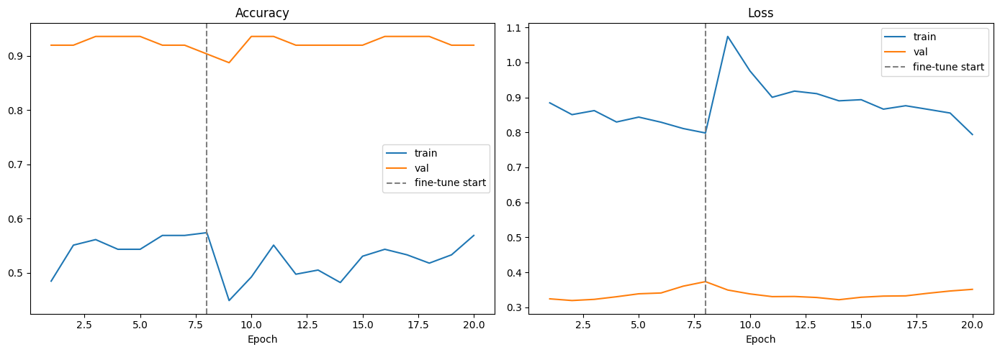

In [32]:
def plot_history(h1, h2):
    acc   = h1.history['accuracy']     + h2.history['accuracy']
    vacc  = h1.history['val_accuracy'] + h2.history['val_accuracy']
    loss  = h1.history['loss']         + h2.history['loss']
    vloss = h1.history['val_loss']     + h2.history['val_loss']
    ep    = range(1, len(acc) + 1)
    ft    = len(h1.history['accuracy'])

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    for ax, y1, y2, title in zip(axes, [acc, loss], [vacc, vloss], ['Accuracy', 'Loss']):
        ax.plot(ep, y1, label='train')
        ax.plot(ep, y2, label='val')
        ax.axvline(ft, color='gray', linestyle='--', label='fine-tune start')
        ax.set_title(title); ax.set_xlabel('Epoch'); ax.legend()
    plt.tight_layout()
    plt.show()

plot_history(h1, h2)

In [33]:
y_pred = np.argmax(model.predict(X_te), axis=1)

print(classification_report(y_te, y_pred, target_names=CLASSES))
print("Confusion matrix:")
print(confusion_matrix(y_te, y_pred))

2/2 ━━━━━━━━━━━━━━━━━━━━ 19s 9s/step
                precision    recall  f1-score   support

         clean       1.00      0.86      0.93        22
slightly_dirty       0.80      0.71      0.75        17
         dirty       0.83      1.00      0.91        24

      accuracy                           0.87        63
     macro avg       0.88      0.86      0.86        63
  weighted avg       0.88      0.87      0.87        63

Confusion matrix:
[[19  3  0]
 [ 0 12  5]
 [ 0  0 24]]


In [34]:
base_conv = tf.keras.models.Model(base.input, base.get_layer('out_relu').output)
dense_layers = [l for l in model.layers if isinstance(l, tf.keras.layers.Dense)]

def gradcam_heatmap(img_array: np.ndarray) -> np.ndarray:
    with tf.GradientTape() as tape:
        conv_out = base_conv(img_array, training=False)
        tape.watch(conv_out)
        x = tf.reduce_mean(conv_out, axis=(1, 2))
        x = dense_layers[0](x)
        preds = dense_layers[1](x)
        class_channel = preds[:, tf.argmax(preds[0])]
    grads   = tape.gradient(class_channel, conv_out)
    pooled  = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = conv_out[0] @ pooled[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()

def show_gradcam(idx: int):
    img  = X_te[idx:idx+1]
    hm   = cv2.resize(gradcam_heatmap(img), (IMG, IMG))
    overlay = 0.5 * img[0] + 0.5 * cm.jet(hm)[..., :3]
    pred = CLASSES[np.argmax(model.predict(img, verbose=0))]
    true = CLASSES[y_te[idx]]
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes[0].imshow(img[0]);  axes[0].set_title(f"true={true}");  axes[0].axis('off')
    axes[1].imshow(overlay); axes[1].set_title(f"pred={pred}");  axes[1].axis('off')
    plt.show()

wrong = [i for i in range(len(y_te)) if y_pred[i] != y_te[i]]
print("Indici gresiti:", wrong)

sample_indices = sorted({0, len(y_te)//2, len(y_te)-1} | set(wrong[:4]))
for i in sample_indices:
    show_gradcam(i)

Output hidden; open in https://colab.research.google.com to view.

In [35]:
def preprocess(img_rgb: np.ndarray) -> np.ndarray:
    """Doar warp perspectiva, fara CLAHE."""
    return cv2.warpPerspective(img_rgb, M, (WARP_W, WARP_H))

def load_img(path: str) -> np.ndarray:
    img = cv2.imread(path)
    if img is None:
        raise FileNotFoundError(f"Nu s-a putut citi: {path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = preprocess(img)
    img = cv2.resize(img, (IMG, IMG))
    return img.astype(np.float32) / 255.0

In [36]:
def load_set(d: pd.DataFrame):
    X = np.stack([load_img(p) for p in d['path']])
    y = d['class'].map(CLASS_TO_IDX).values
    return X, y

X_tr,  y_tr  = load_set(df_tr)
X_val, y_val = load_set(df_val)
X_te,  y_te  = load_set(df_te)

print("Train:", X_tr.shape, "| Val:", X_val.shape, "| Test:", X_te.shape)
print("y_tr:",  np.unique(y_tr,  return_counts=True))
print("y_val:", np.unique(y_val, return_counts=True))
print("y_te:",  np.unique(y_te,  return_counts=True))

Train: (392, 224, 224, 3) | Val: (62, 224, 224, 3) | Test: (63, 224, 224, 3)
y_tr: (array([0, 1, 2]), array([134, 123, 135]))
y_val: (array([0, 1, 2]), array([16, 19, 27]))
y_te: (array([0, 1, 2]), array([22, 17, 24]))


In [37]:
aug = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.06),
    layers.RandomBrightness(0.15),
    layers.RandomContrast(0.15),
])

base = MobileNetV2(input_shape=(IMG, IMG, 3), include_top=False, weights='imagenet')
base.trainable = False

model = models.Sequential([
    layers.Input((IMG, IMG, 3)),
    aug,
    base,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(len(CLASSES), activation='softmax'),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

In [38]:
es = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=6, restore_best_weights=True
)

h1 = model.fit(
    X_tr, y_tr,
    validation_data=(X_val, y_val),
    epochs=40,
    batch_size=16,
    callbacks=[es],
)

Epoch 1/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - accuracy: 0.3750 - loss: 1.3597 - val_accuracy: 0.4355 - val_loss: 1.2317
Epoch 2/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 22s 873ms/step - accuracy: 0.4082 - loss: 1.1520 - val_accuracy: 0.3710 - val_loss: 0.9226
Epoch 3/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 891ms/step - accuracy: 0.4388 - loss: 1.0208 - val_accuracy: 0.6452 - val_loss: 0.6999
Epoch 4/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 42s 952ms/step - accuracy: 0.5204 - loss: 0.9187 - val_accuracy: 0.6935 - val_loss: 0.6618
Epoch 5/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 22s 890ms/step - accuracy: 0.5153 - loss: 0.8889 - val_accuracy: 0.6290 - val_loss: 0.6628
Epoch 6/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.5179 - loss: 0.9168 - val_accuracy: 0.8065 - val_loss: 0.5286
Epoch 7/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 21s 838ms/step - accuracy: 0.5459 - loss: 0.8653 - val_accuracy: 0.8065 - val_loss: 0.5263
Epoch 8/40
25/25 ━━━━━━━━━━━━━━━━━━━━ 24s 953ms/step - accuracy: 0.5102 - loss: 0.8777 - val_accuracy: 

In [39]:
base.trainable = True
for layer in base.layers[:-20]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

h2 = model.fit(
    X_tr, y_tr,
    validation_data=(X_val, y_val),
    epochs=15,
    batch_size=16,
    callbacks=[es],
)

Epoch 1/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - accuracy: 0.4005 - loss: 1.6718 - val_accuracy: 0.8871 - val_loss: 0.3572
Epoch 2/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.4694 - loss: 1.1221 - val_accuracy: 0.8871 - val_loss: 0.3643
Epoch 3/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.4617 - loss: 1.0593 - val_accuracy: 0.8710 - val_loss: 0.3723
Epoch 4/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.4796 - loss: 0.9733 - val_accuracy: 0.8548 - val_loss: 0.3776
Epoch 5/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.5179 - loss: 0.9331 - val_accuracy: 0.8387 - val_loss: 0.3975
Epoch 6/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.4847 - loss: 0.9384 - val_accuracy: 0.8226 - val_loss: 0.3915
Epoch 7/15
25/25 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.5459 - loss: 0.8780 - val_accuracy: 0.8226 - val_loss: 0.4000


In [40]:
y_pred = np.argmax(model.predict(X_te), axis=1)

print(classification_report(y_te, y_pred, target_names=CLASSES))
print("Confusion matrix:")
print(confusion_matrix(y_te, y_pred))

2/2 ━━━━━━━━━━━━━━━━━━━━ 11s 6s/step
                precision    recall  f1-score   support

         clean       1.00      0.95      0.98        22
slightly_dirty       0.94      0.88      0.91        17
         dirty       0.92      1.00      0.96        24

      accuracy                           0.95        63
     macro avg       0.95      0.95      0.95        63
  weighted avg       0.95      0.95      0.95        63

Confusion matrix:
[[21  1  0]
 [ 0 15  2]
 [ 0  0 24]]


In [41]:
# Model FINAL pentru deploy: antreneaza pe TOATE sesiunile A-H (fara aux).
# Nu mai exista test pe sesiune nevazuta - aceasta a fost deja masurata separat (95%).
# Pastram un val mic (stratificat random) doar pentru EarlyStopping.
from sklearn.model_selection import train_test_split

print("Sesiuni folosite:", sorted(df['session_id'].unique()))

df_tr, df_val = train_test_split(
    df,
    test_size=0.12,
    stratify=df['class'],
    random_state=42,
)
df_te = df_val   # placeholder ca sa nu crape celulele de evaluare; nu e test real

print("TRAIN:", len(df_tr), dict(df_tr['class'].value_counts()))
print("VAL:  ", len(df_val), dict(df_val['class'].value_counts()))

Sesiuni folosite: ['lumina_A', 'lumina_B', 'lumina_C', 'lumina_D', 'lumina_E', 'lumina_F', 'lumina_G', 'lumina_H']
TRAIN: 454 {'dirty': np.int64(163), 'clean': np.int64(151), 'slightly_dirty': np.int64(140)}
VAL:   63 {'dirty': np.int64(23), 'clean': np.int64(21), 'slightly_dirty': np.int64(19)}


In [42]:
df = pd.read_csv(os.path.join(DATA, 'manifest.csv'))
df['path'] = df.apply(lambda r: os.path.join(RAW, r['session_id'], r['class'], r['filename']), axis=1)
df = df[df['path'].apply(os.path.exists)].reset_index(drop=True)
df = df[df['class'].isin(CLASSES)].reset_index(drop=True)

# EXCLUDE sesiunile aux
df = df[~df['session_id'].str.contains('aux', case=False)].reset_index(drop=True)

print("total (fara aux):", len(df))
print(df['class'].value_counts())
print("sesiuni:", sorted(df['session_id'].unique()))

total (fara aux): 517
class
dirty             186
clean             172
slightly_dirty    159
Name: count, dtype: int64
sesiuni: ['lumina_A', 'lumina_B', 'lumina_C', 'lumina_D', 'lumina_E', 'lumina_F', 'lumina_G', 'lumina_H']


In [44]:
# Model FINAL pentru deploy: antreneaza pe TOATE sesiunile A-H (fara aux).
# Generalizarea a fost deja masurata separat (95% pe sesiune nevazuta).
# Pastram doar un val mic stratificat pentru EarlyStopping.
print("Sesiuni folosite:", sorted(df['session_id'].unique()))

df_tr, df_val = train_test_split(
    df,
    test_size=0.12,
    stratify=df['class'],
    random_state=42,
)

print("TRAIN:", len(df_tr), dict(df_tr['class'].value_counts()))
print("VAL:  ", len(df_val), dict(df_val['class'].value_counts()))

Sesiuni folosite: ['lumina_A', 'lumina_B', 'lumina_C', 'lumina_D', 'lumina_E', 'lumina_F', 'lumina_G', 'lumina_H']
TRAIN: 454 {'dirty': np.int64(163), 'clean': np.int64(151), 'slightly_dirty': np.int64(140)}
VAL:   63 {'dirty': np.int64(23), 'clean': np.int64(21), 'slightly_dirty': np.int64(19)}


In [45]:
def load_set(d: pd.DataFrame):
    X = np.stack([load_img(p) for p in d['path']])
    y = d['class'].map(CLASS_TO_IDX).values
    return X, y

X_tr,  y_tr  = load_set(df_tr)
X_val, y_val = load_set(df_val)

print("Train:", X_tr.shape, "| Val:", X_val.shape)
print("y_tr:",  np.unique(y_tr,  return_counts=True))
print("y_val:", np.unique(y_val, return_counts=True))

Train: (454, 224, 224, 3) | Val: (63, 224, 224, 3)
y_tr: (array([0, 1, 2]), array([151, 140, 163]))
y_val: (array([0, 1, 2]), array([21, 19, 23]))


In [46]:
aug = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.06),
    layers.RandomBrightness(0.15),
    layers.RandomContrast(0.15),
])

base = MobileNetV2(input_shape=(IMG, IMG, 3), include_top=False, weights='imagenet')
base.trainable = False

model = models.Sequential([
    layers.Input((IMG, IMG, 3)),
    aug,
    base,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(len(CLASSES), activation='softmax'),
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

In [47]:
es = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=6, restore_best_weights=True
)

h1 = model.fit(
    X_tr, y_tr,
    validation_data=(X_val, y_val),
    epochs=40,
    batch_size=16,
    callbacks=[es],
)

Epoch 1/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 43s 937ms/step - accuracy: 0.3502 - loss: 1.3648 - val_accuracy: 0.3016 - val_loss: 2.4003
Epoch 2/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 24s 826ms/step - accuracy: 0.4648 - loss: 1.0687 - val_accuracy: 0.5556 - val_loss: 1.1362
Epoch 3/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 40s 795ms/step - accuracy: 0.4868 - loss: 0.9819 - val_accuracy: 0.3968 - val_loss: 1.7357
Epoch 4/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 43s 846ms/step - accuracy: 0.4824 - loss: 0.9685 - val_accuracy: 0.6825 - val_loss: 0.6998
Epoch 5/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 41s 844ms/step - accuracy: 0.4912 - loss: 0.9131 - val_accuracy: 0.6508 - val_loss: 0.6727
Epoch 6/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 26s 891ms/step - accuracy: 0.5088 - loss: 0.8933 - val_accuracy: 0.6032 - val_loss: 0.9433
Epoch 7/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 23s 797ms/step - accuracy: 0.5132 - loss: 0.8855 - val_accuracy: 0.4762 - val_loss: 0.8385
Epoch 8/40
29/29 ━━━━━━━━━━━━━━━━━━━━ 42s 822ms/step - accuracy: 0.4978 - loss: 0.9064 - val_accu

In [48]:
base.trainable = True
for layer in base.layers[:-20]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

h2 = model.fit(
    X_tr, y_tr,
    validation_data=(X_val, y_val),
    epochs=15,
    batch_size=16,
    callbacks=[es],
)

Epoch 1/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step - accuracy: 0.4273 - loss: 1.3881 - val_accuracy: 0.9683 - val_loss: 0.1364
Epoch 2/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step - accuracy: 0.4581 - loss: 1.0592 - val_accuracy: 0.9683 - val_loss: 0.1355
Epoch 3/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step - accuracy: 0.4912 - loss: 1.0469 - val_accuracy: 0.9683 - val_loss: 0.1377
Epoch 4/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 39s 991ms/step - accuracy: 0.5110 - loss: 0.9929 - val_accuracy: 0.9683 - val_loss: 0.1411
Epoch 5/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.4802 - loss: 1.0453 - val_accuracy: 0.9683 - val_loss: 0.1451
Epoch 6/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.4515 - loss: 1.0415 - val_accuracy: 0.9683 - val_loss: 0.1536
Epoch 7/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step - accuracy: 0.5419 - loss: 0.9397 - val_accuracy: 0.9524 - val_loss: 0.1588
Epoch 8/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step - accuracy: 0.5132 - loss: 0.9292 - val_accuracy: 0.9524 - val_lo

In [49]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_types = [tf.float16]
tflite_model = converter.convert()

with open('/content/dirt_detection_v4_final.tflite', 'wb') as f:
    f.write(tflite_model)

print(f"Dimensiune model: {len(tflite_model) / 1024 / 1024:.2f} MB")

Saved artifact at '/tmp/tmp9spx8ben'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_488')
Output Type:
  TensorSpec(shape=(None, 3), dtype=tf.float32, name=None)
Captures:
  136894720687184: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136894680466448: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136894680466256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136894720686608: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136894680467024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136894680465680: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136894680466640: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136894680466832: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136894680465872: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136894680467984: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1368946804

In [50]:
!cp /content/dirt_detection_v4_final.tflite /content/drive/MyDrive/dirt_detection_v4_final.tflite
print("Salvat: dirt_detection_v4_final.tflite")

Salvat: dirt_detection_v4_final.tflite
